In [157]:
import os
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

## Import files

In [170]:
files = "C:/Users/zhongj/Desktop/Task3_Data/Data_to_Use"
os.chdir(files)

df= pd.read_excel("Sites_Information.xlsx")

In [171]:
## add size column to dataframe

def size_func(x):
    if x <= 250 :
        return 1
    elif x>250 and x<= 1000:
        return 2
    elif x> 1000 and x<= 2500:
        return 3
    else:
        return 4
    
df['Size'] = df.apply(lambda x: size_func(x['Total_Capacity']), axis = 1)

In [172]:
## add colors column and Size Name column to dataframe

colors = ['red', 'orange', 'mediumorchid','steelblue']
bins = ['Bin1: 0KW - 250KW', 'Bin2: 250KW - 1000KW', 'Bin3: 1000KW - 2500KW', 'Bin4: Over 2500KW']

list_index = [1,2,3,4]
df['Color'] =df['Size'].apply(lambda x:colors[list_index.index(x)])
df['Size (Total Capacity)'] =df['Size'].apply(lambda x:bins[list_index.index(x)])

###### chosen sites

In [173]:
df1 = pd.read_excel("Chosen_Sites_BTM_Daily_5am_9pm.xlsx")
sites = list(df1.columns)
sites.remove('DateTime')
sites.remove('Year')
sites.remove('Month')
sites.remove('Day')

In [174]:
sites2 = list(map(int, sites))
df.index = df['Project_ID']
df2 = df.loc[sites2,:]
df2 = df2.reset_index(drop = True)

## Deal with geo files

###### convert kml file to gepjson file

In [ ]:
#import kml2geojson as k2g
# k2g.convert("NYCA_LoadZone_Boundaries.kml", 'NYCA_LoadZone_Boundaries.geojson')

###### convert gepjson file to SHP file

In [ ]:
# aa = gpd.read_file('Zone_Boundaries_Geojson.geojson')
# aa.to_file('Zone_Boundaries_SHP',driver = 'ESRI Shapefile', encoding='utf-8')

###### reformat Shp file

In [ ]:
def convert_3D_2D(geometry):
    '''
    Takes a GeoSeries of 3D Multi/Polygons (has_z) and returns a list of 2D Multi/Polygons
    '''
    new_geo = []
    for p in geometry:
        if p.has_z:
            if p.geom_type == 'Polygon':
                lines = [xy[:2] for xy in list(p.exterior.coords)]
                new_p = Polygon(lines)
                new_geo.append(new_p)
            elif p.geom_type == 'MultiPolygon':
                new_multi_p = []
                for ap in p:
                    lines = [xy[:2] for xy in list(ap.exterior.coords)]
                    new_p = Polygon(lines)
                    new_multi_p.append(new_p)
                new_geo.append(MultiPolygon(new_multi_p))
    return new_geo

In [ ]:
# geodf_2d = gpd.GeoDataFrame.from_file("Zone_Boundaries_SHP\Zone_Boundaries_SHP.shp") # plug_in your shapefile
# geodf_2d.geometry = convert_3D_2D(geodf_2d.geometry) # new geodf with 2D geometry series
# geodf_2d.to_file('Zone_Boundaries_SHP',driver = 'ESRI Shapefile', encoding='utf-8')

## Using folium package to make map

In [179]:
files = "C:/Users/zhongj/Desktop/Mapping_Files"
os.chdir(files)

In [164]:
import folium
import json
with open('Zone_Boundaries_Without_Midpoints.geojson') as f:
    zone_df = json.load(f)

In [201]:
def folium_map(df,colors, bins):
    ny_map = folium.Map(location=[42.8,-75.5], zoom_start=6.5, tiles  = 'Stamen Terrain', min_zoom =6.5, max_zoom = 9)
                        #, zoom_control = False, scrollWheelZoom = False, dragging = False)

    folium.GeoJson(zone_df, style_function = lambda features:{
        'fillColor':'pink', 'color': 'black', 'weight': 1.5,'dashArray':'5,5'}).add_to(ny_map)

    # add marker one by one on the map
    for i in range(0,len(df)):
        html=f"""
            <p> {df.iloc[i]['Facility_Name']}</p>
            <ul>
                <li>Total Capacity: {df.iloc[i]['Total_Capacity']}</li>

                <li>NYISO Zone: {df.iloc[i]['NYISO_Zone']} </li>

                <li>Zipcode: {df.iloc[i]['ZIP']}</li>

            </ul>
            </p>

            """
        iframe = folium.IFrame(html=html, width=250, height=150)
        popup = folium.Popup(iframe, max_width=2650)
    #     if df.iloc[i]['Total_Capacity']< 500:
    #         circle_size = df.iloc[i]['Total_Capacity']/250
    #     else:
    #         circle_size = df.iloc[i]['Total_Capacity']/500
        if df.iloc[i]['Size'] == 1:
            circle_size = 0.5
            fo = 1
        elif df.iloc[i]['Size'] == 2:
            circle_size = 2
            fo = 1
        elif df.iloc[i]['Size'] == 3:
            circle_size = 5
            fo = 0.7
        else:
            circle_size = 8
            fo = 0.7

        folium.CircleMarker(
            location=[df.iloc[i]['Latitude'], df.iloc[i]['Longitude']],
            popup=popup,
            radius= circle_size,
            color = df.iloc[i]['Color'],
            fill = True,
            fill_color =df.iloc[i]['Color'],
            fill_opacity = fo
        ).add_to(ny_map)
        
    
    counts = []
    for i in range(1,5):
        count = len(df[df['Size']==i])
        counts.append(count)
    
        
    legend_html = """<div style='position: absolute; z-index:9999; border:2px solid grey; background-color:rgba(255, 255, 255, 0.8);
     border:2px; padding: 10px; font-size:12px; right: 10px; top: 10px;'>&nbsp;<div class='legend-title'>Total Capacity: Number of Sites</div>"""


    for i in list_index:
         legend_html = legend_html + """&nbsp;<i class="fa fa-circle 
         fa-1x" style="color:"""+ colors[i-1]+"""">
         </i>&nbsp;"""+ bins[i-1]+ """: %d sites"""%counts[i-1]+"""<br>"""

    legend_html = legend_html+"""</div>"""
    ny_map.get_root().html.add_child(folium.Element(legend_html))#plot
    
    ny_map.save(outfile = '%d_Solar_Generation_Sites.html'%len(df))
    
    return ny_map

In [202]:
folium_map(df,colors, bins)

In [203]:
folium_map(df2,colors, bins)

## Using Basemap package to make map

In [14]:
import geopandas as gpd
from mpl_toolkits.basemap import Basemap
import matplotlib.patches as mpatches

C:\Users\zhongj\Zhongj1\ZhongJ\lib\site-packages\ipykernel_launcher.py:3: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  This is separate from the ipykernel package so we can avoid doing imports until


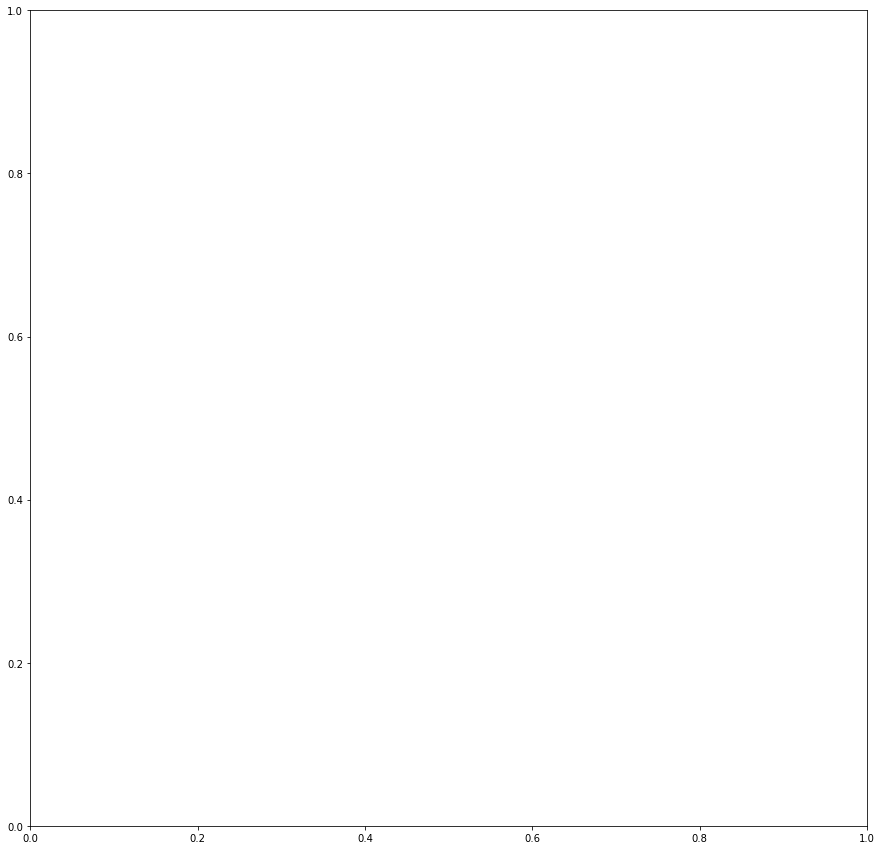

In [15]:
fig= plt.subplots(num=None, figsize = (15, 15))
ny_m = Basemap(projection = 'stere', lon_0 = -76, lat_0 = 42.5, llcrnrlat = 40, urcrnrlat = 45.2, llcrnrlon = -80, urcrnrlon = -71.5,
              resolution = 'f')

In [198]:
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection


def basic_ny_map(df, colors):
    fig, ax= plt.subplots(num=None, figsize = (15, 15))
    #ny_m.readshapefile('cb_2018_us_state_20m\cb_2018_us_state_20m', 'NY')
    ny_m.readshapefile('Zone_Boundaries_SHP\Zone_Boundaries_SHP', 'Zones')
    
# Draw different color of lines:    
#     for info, shape in zip(ny_m.Zones_info, ny_m.Zones):
#         if info['name'] == 'A' or info['name'] == 'B' or info['name'] == 'C':
#             x,y = zip(*shape)
#             ny_m.plot(x,y, marker = None, color = '#0000FF')
#         elif info['name'] == 'D' or info['name'] == 'E' or info['name'] == 'F':
#             x,y = zip(*shape)
#             ny_m.plot(x,y, marker = None, color = '#0072BD')
#         else:
#             x,y = zip(*shape)
#             ny_m.plot(x,y, marker = None, color = '#4DBEEE')

# Draw different color of area:
    patches1 = []
    patches2 = []
    patches3 = []
    for info, shape in zip(ny_m.Zones_info, ny_m.Zones):
        if info['name'] == 'A' or info['name'] == 'B' or info['name'] == 'C':
            patches1.append(Polygon(np.array(shape), True))
        elif info['name'] == 'D' or info['name'] == 'E' or info['name'] == 'F':
            patches2.append(Polygon(np.array(shape), True))
        else:
            patches3.append(Polygon(np.array(shape), True))
            
    ax.add_collection(PatchCollection(patches1, facecolor = 'yellowgreen' , alpha = 0.07))
    ax.add_collection(PatchCollection(patches2, facecolor = 'darkolivegreen' , alpha = 0.07))
    ax.add_collection(PatchCollection(patches3, facecolor = 'palegreen' , alpha = 0.06))

    parallels = np.arange(39,46)
    ny_m.drawparallels(parallels,labels = [1,1,0,0], fontsize = 10, color = 'gray')
    meridians = np.arange(-81,-70)
    ny_m.drawmeridians(meridians,labels = [0,0,1,1], fontsize = 10, color = 'gray')

    x, y = ny_m(df['Longitude'].values, df['Latitude'].values)
    Size_ = np.array(df['Size'])
    Color_ = np.array(df['Color'])
    Desc = np.array(df['Size (Total Capacity)'])
    for lon, lat, circle_size, cl, d in zip(x, y, Size_, Color_, Desc):
        if circle_size == 1:
            pop = 10
        elif circle_size == 2:
            pop = 20
        elif circle_size == 3:
            pop = 50
        else:
            pop = 100

        ny_m.scatter(lon, lat, s= pop, c = cl, label = d)
        
    counts = []
    for i in range(1,5):
        count = len(df[df['Size']==i])
        counts.append(count)

    bin1 = mpatches.Patch(color=colors[0], label='0KW - 250KW: %d sites'%counts[0])
    bin2 = mpatches.Patch(color=colors[1], label='250KW - 1000KW: %d sites'%counts[1])
    bin3 = mpatches.Patch(color=colors[2], label='1000KW - 2500KW: %d sites'%counts[2])
    bin4 = mpatches.Patch(color=colors[3], label=' Over 2500KW: %d sites'%counts[3])
    plt.legend(handles=[bin1,bin2,bin3, bin4], title='Total Capacity: Number of sites')
    
    
    plt.savefig('%d_Solar_Generation_Sites'%len(df), bbox_inches = 'tight', pad_inches = 0.5)
    
    plt.show()

C:\Users\zhongj\Zhongj1\ZhongJ\lib\site-packages\ipykernel_launcher.py:8: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  


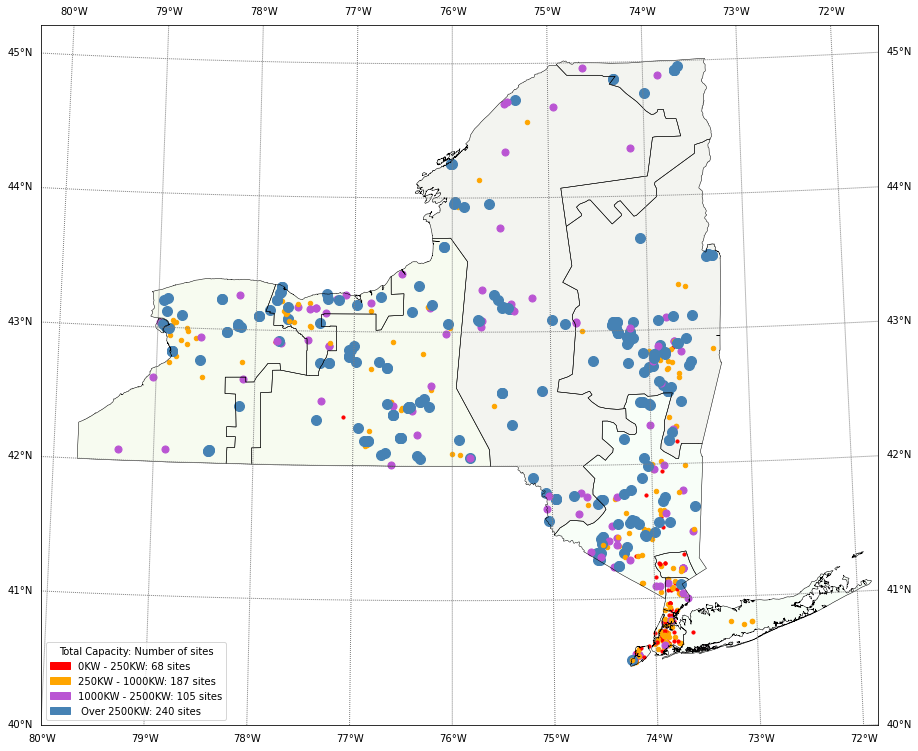

In [199]:
basic_ny_map(df,colors)

C:\Users\zhongj\Zhongj1\ZhongJ\lib\site-packages\ipykernel_launcher.py:8: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  


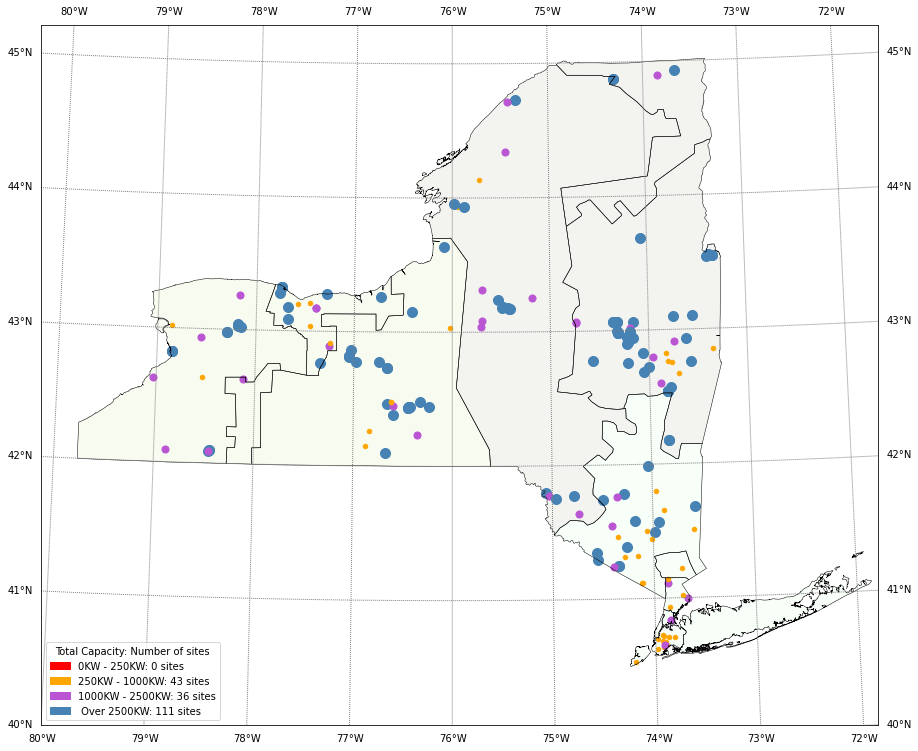

In [200]:
basic_ny_map(df2,colors)